# 0 SciPy：蟒蛇牌科学计算工具箱的观赏之旅

### SciPy是建立在在Numpy基础上的科学计算库，提供大量的科学计算支持。

在科学计算中我们往往会用到如下4个常用而又强大的功能：

*    数值优化：scipy.optimize, 最优问题的数值近似解问题能够得到求解
*    数值积分：scipy.integrate, 能够从数值角度求解积分问题，可以当作解析解的验证手段；同时也能够像Matlab一样求解微分方程
*    插值算法：scipy.interpolate, 采样精度过低时可以使用interpolate得到连续曲线
*    信号处理：scipy.signal, scipy.fftpack 滤波器和时间序列模型在数学上有异曲同工之妙，此处用这些库实现信号处理功能

SciPy的其他重要内容会在其他内容中反复提及，比如

*    线性代数：scipy.linalg直接映射了np.linalg的功能，如矩阵特征值分解、SVD分解、QR分解等。
*    统计功能：scipy.stats具有强大的统计分布生成、探索、检查功能，在统计分布/随机数生成部分中结合理论介绍。
*    稀疏矩阵：scipy.sparse在NumPy基础和NetworkX部分有所提及，在网络图模型中占有一席之地。
*    科学函数：scipy.special, 能够快速给出一些科学函数的值（常见的如贝塞尔函数，排列组合数等）

### 开始SciPy之旅前：

In [1]:
import numpy as np
import scipy as sp
import bokeh as bk
import bokeh.plotting as bplt
import numpy as np
import scipy.stats as spstat
N = 10000
# 工具配置
TOOLS = "pan,wheel_zoom,box_zoom,box_select"
# 作图配置
plot_config = dict(plot_width=600, plot_height=360, tools=TOOLS)

In [21]:
%matplotlib inline
%pylab inline
import matplotlib.pyplot as plt
import pylab as pl

from matplotlib.font_manager import FontProperties
fontPath = r"/Users/wangweiyang/Anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/fonts/ttf/msyh.ttf"
fontx = FontProperties(fname=fontPath, size=10)

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


上面的代码中最后几行是为了让Matplotlib能够显示中文的，除了执行以上代码以外还需要在系统中进行如下设置：

*   修改matplotlibrc,找到找到以下两项，去掉#号
    * font.family         : sans-serif        
    * font.sans-serif     : Microsoft YaHei, Bitstream Vera Sans, Lucida Grande, Verdana, Geneva, Lucid, Arial, Helvetica, Avant Garde, sans-serif
* 为font.sans-serif中添加“Microsoft YaHei”,该行指示缺省字体
* 在上述fontPath中增加msyh.ttf的绝对路径

# 1 SciPy 数值优化 scipy.optimize 

In [4]:
import scipy.optimize as sopt

### 1.1 最小二乘非线性拟合

给定对函数$g(x)$的观测值和函数f(x,p)的形式，欲求得对params的估计值$\hat{p}$使得：

$\Sigma (g(x)-f(x,\hat{p}))^2$ 达到最小值，这是一个最小值问题。

In [5]:
A,k,theta = 10,0.2,np.pi/6
x = np.linspace(0,2*np.pi,100)
y = A*np.sin(x*2*np.pi*k+theta)
yobs = y+2*np.random.randn(len(x))


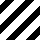
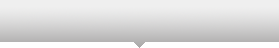
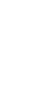
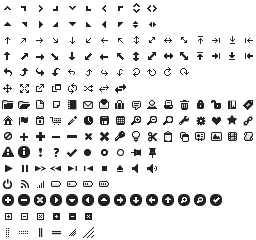
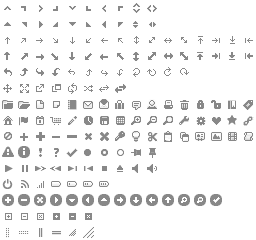
...
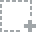
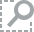
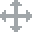
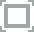
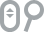

In [14]:
bplt.output_notebook()
p1 = bplt.figure(title="含高频噪声的正弦波函数",
       background_fill="#E8DDCB",**plot_config)
p1.line(x, y, line_color="steelblue", line_width=3, alpha=0.7, legend="真实波形")
p1.line(x, yobs, line_color="red", line_width=1, alpha=0.7, legend="含噪声波形")
bplt.show(p1)

已知定义正弦波函数：

$y(x) = A sin(2\pi kx+\theta)$

能够观察到含有噪声的$y_{obs}$正弦波观测值，通过一定平滑手段大致得到参数范围

定义残差函数res：

In [16]:
def res(params,y,x):
    A,k,theta = params
    return y-A*np.sin(x*2*np.pi*k+theta)

定义迭代的初始参数，并且把残差函数、初始值（单参数的列表）和其他参数按顺序传给scipy.optimize.leastsq

In [17]:
init = [15,0.12,0]

convrg = sopt.leastsq(res,init,args=(y,x))
A_,k_,theta_ = convrg[0]
ypred = A_*np.sin(x*2*np.pi*k_+theta_)
print convrg[0]

[-10.           0.2         -2.61799388]


可以看到最优收敛值的波幅相反，周期完全一致，相位相差一个$\pi$


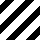
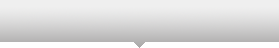
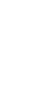
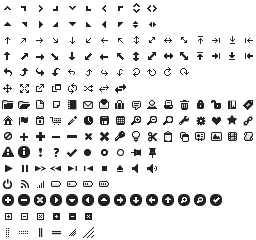
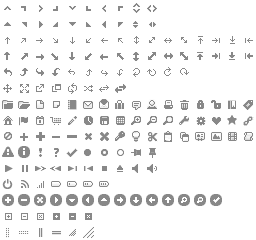
...
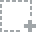
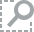
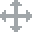
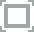
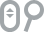

In [23]:
bplt.output_notebook()
p1 = bplt.figure(title="非线性最小二乘法估计正弦波",
       background_fill="#E8DDCB",**plot_config)
p1.line(x, y, line_color="steelblue", line_width=3, alpha=0.5, legend="真实波形")
p1.line(x, yobs, line_color="red", line_width=1, alpha=0.5, legend="含噪声波形")
p1.line(x, ypred, line_color="green", line_width=2, alpha=0.5, legend="估计波形")
bplt.show(p1)

### 1.2 参数寻找最小值

在更一般的问题中，使用fmin、fmin_powell、fmin_bfgs、fmin_cg函数来寻找最优值


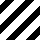
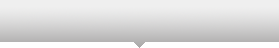
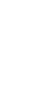
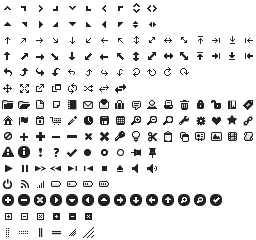
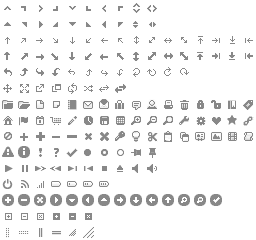
...
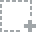
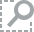
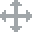
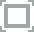
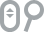

In [35]:
def f(x):
    return 4*x**3 + (x-2)**2 + x**4
x = np.linspace(-5, 3, 100)
bplt.output_notebook()
p1 = bplt.figure(title="不知名函数f(x)",
       background_fill="#E8DDCB",**plot_config)
p1.line(x, f(x), line_color="steelblue", line_width=3, alpha=0.7, legend="函数曲线")
bplt.show(p1)

以下几个寻找最优的函数我们将逐步在最优化理论里介绍。

In [36]:
x_min  = sopt.fmin(f , -4)
x_minp = sopt.fmin_powell(f , -4)
x_minb = sopt.fmin_bfgs(f , -4)
x_minc = sopt.fmin_cg(f , -4)
x_mino = sopt.fminbound(f , -4 , 2)
x_minr = sopt.brent(f)

Optimization terminated successfully.
         Current function value: -3.506641
         Iterations: 16
         Function evaluations: 32
Optimization terminated successfully.
         Current function value: -3.506641
         Iterations: 2
         Function evaluations: 34
Optimization terminated successfully.
         Current function value: 2.804988
         Iterations: 6
         Function evaluations: 42
         Gradient evaluations: 14
         Current function value: 2.805230
         Iterations: 2
         Function evaluations: 33
         Gradient evaluations: 7


In [37]:
print x_min,x_minp,x_minb,x_minc,x_mino,x_minr
print f(-2.67298),f(0.469617)

[-2.67294922] -2.67298165713 [ 0.46961742] [ 0.47511948] -2.67298229175 0.469617434028
-3.5066414569 2.80498764487



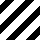
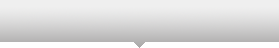
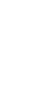
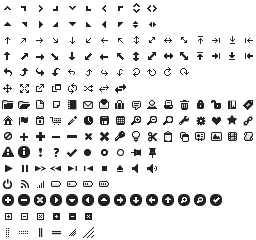
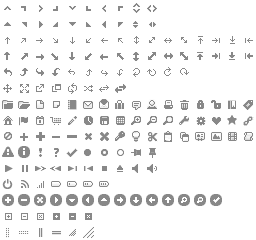
...
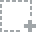
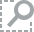
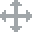
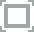
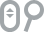

In [43]:
bplt.output_notebook()
p1 = bplt.figure(title="不知名函数f(x)",
       background_fill="#E8DDCB",**plot_config)
offset = 1.0
p1.line(x, [f(i) for i in x], \
        line_color="steelblue", line_width=3, alpha=0.7, legend="函数曲线")
p1.line([x_min[0]-offset,x_min[0]+offset],[f(x_min[0]),f(x_min[0])], \
        line_color="black", line_width=2, alpha=0.7, legend="x_min处切线")
p1.line([x_minr-offset,x_minr+offset],[f(x_minr),f(x_minr)], \
        line_color="black", line_width=2, alpha=0.7, legend="x_minr处切线")
bplt.show(p1)

### 1.3 数值求解非线性方程

从数学意义上看，求最小值（或者至少是求解局部最小值）的过程是：找到导数为0的点，并且该处二阶导数大于0。

这等价于找到了1.2节问题的导函数$f'$（或者是近似导函数）后寻找$f'$穿过横轴的解，我们自然会知道scipy.optimize一定有非线性方程求解函数。

fsolve可以求解非线性方程，继续使用上例

In [44]:
def fp(x):
    return 12*x**2 + 2*(x-2) + 4*x**3

result = sopt.fsolve(fp,-3)
print result

[-2.67298165]


假设我们有如下的非线性方程组，求解仍然可以使用fsolve：

$\begin{equation}
  \left\{
   \begin{aligned}
   5 x_1+3 &=0  \\
   4 x_0^2 -2 sin(x_1x_2)&=0 \\
   x_1x_2 - 1.5 &= 0
   \end{aligned}
   \right.
  \end{equation}$

In [45]:
def farray(x):
    x0 = float(x[0])
    x1 = float(x[1])
    x2 = float(x[2])
    return [
        5*x1+3,
        4*x0*x0 - 2*np.sin(x1*x2),
        x1*x2 - 1.5
    ]
result = sopt.fsolve(farray, [1,1,1])
print result
print farray(result)

[-0.70622057 -0.6        -2.5       ]
[0.0, -9.1260332624187868e-14, 5.329070518200751e-15]


可以看到精度不错。问题在于是通过数值解法寻找解，一般只能给出一个解。

如果能够给fsolve输入导数矩阵也就是Jacobi（雅可比）矩阵的话，相当于不再需要近似计算这个矩阵，速度会有一定的提高。

雅可比矩阵的形式如下：$f,g,h$是函数，$x,y,z$是变量：

$\begin{equation}
\left[
\begin{aligned}
\frac{\partial f}{\partial x} \frac{\partial f}{\partial y} \frac{\partial f}{\partial z} \\
\frac{\partial g}{\partial x} \frac{\partial g}{\partial y} \frac{\partial g}{\partial z} \\
\frac{\partial h}{\partial x} \frac{\partial h}{\partial y} \frac{\partial h}{\partial z} \\
\end{aligned}
\right]
\end{equation}$

定义雅可比矩阵函数再次使用fsolve：

In [46]:
def j(x):
    x0 = float(x[0])
    x1 = float(x[1])
    x2 = float(x[2])
    return [[0, 5, 0],
        [8*x0, -2*x2*np.cos(x1*x2), -2*x1*np.cos(x1*x2)],
        [0, x2, x1]]
result = sopt.fsolve(farray, [1,1,1], fprime=j)
print result,farray(result)

[-0.70622057 -0.6        -2.5       ] [0.0, -9.1260332624187868e-14, 5.329070518200751e-15]


# 2 SciPy数值积分 scipy.integrate

In [11]:
import scipy.integrate as sint

### 2.1 数值定积分

数值积分是对定积分的数值求解，顾名思义，他不会用符号计算而采用数值逼近方式。

以求单位圆形面积和单位球形体积来做实验。

单位圆方程：$x^2+y^2 \leq 1$

单位球方程：$x^2+y^2+z^2 \leq 1$

如下的圆环函数circle和球壳函数hulk表示着我们做积分时候的积分边界，当传入的参数为numpy.ndarray时他们恰好可以当作ufunc使用：

In [12]:
def circle(x):
    return (1.0-x**2)**0.5

def hulk(x,y):
    return (1.0-x**2-y**2)**0.5

试求用矩形逼近法求圆形面积：

3.069269298



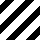
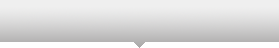
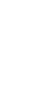
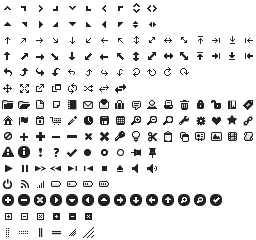
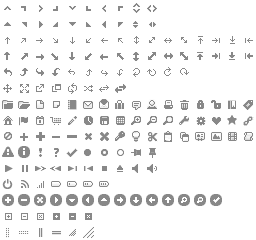
...
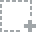
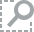
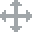
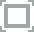
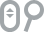

In [13]:
N = 50
x = np.linspace(-1,1,N)
dx = 2.0/N
y = circle(x)
print dx*np.sum(y)*2
plot_config = dict(plot_width=600, plot_height=400,  tools=TOOLS)
bplt.output_notebook()
p1 = bplt.figure(title="矩形法求积分",
       background_fill="#E8DDCB", x_range = [-1.2,1.2] , y_range=[-0.2,1.2], **plot_config)
p1.rect(x, y/2, 0.04 ,y, \
        line_color="steelblue", line_width=1, alpha=0.7, legend="矩形逼近半圆周")
p1.line(x, y , line_color = "black", line_width=0.5, alpha=0.7, legend="半圆周")
bplt.show(p1)

In [28]:
trapmaker = lambda x: ' nan '.\
        join([ ' '.join([str(item) for item in list(x[:,i]) ]) for i in xrange(xtrap.shape[1])]).split(' ')
xleft = x[:-1].reshape(1,len(x)-1)
xright = x[1:].reshape(1,len(x)-1)
xtrap = np.concatenate([xleft,xright,xright,xleft],axis=0)
yleft = y[:-1].reshape(1,len(y)-1)
yright = y[1:].reshape(1,len(y)-1)
ytrap = np.concatenate([np.zeros_like(xleft),np.zeros_like(xright),yright,yleft],axis=0)

换用梯形numpy现有的梯形(trapezoidal)逼近法求圆形面积：

3.13190744694



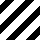
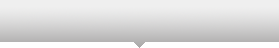
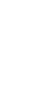
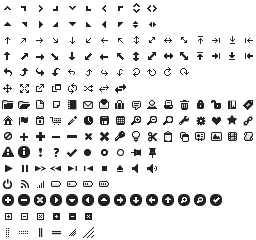
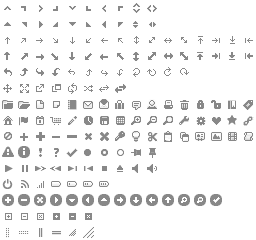
...
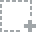
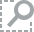
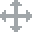
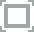
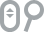

In [29]:
print np.trapz(y,x)*2

plot_config = dict(plot_width=600, plot_height=400,  tools=TOOLS)
bplt.output_notebook()
p1 = bplt.figure(title="梯形法求积分",
       background_fill="#E8DDCB", x_range = [-1.2,1.2] , y_range=[-0.2,1.2], **plot_config)
p1.patch(np.float64(np.array(trapmaker(xtrap))), \
         np.float64(np.array(trapmaker(ytrap))), line_width=1, alpha=0.7, legend="梯形逼近半圆周")
p1.line(x, y , line_color = "black", line_width=0.5, alpha=0.7, legend="半圆周")
bplt.show(p1)

用scipy.integrate二次(quadratic)逼近求圆形面积：

In [16]:
half_pi, eps = sint.quad(circle,-1,1)
print half_pi*2, eps

3.14159265359 1.00023545002e-09


可以看到精度是逐渐上升的。

可以想见，多重定积分通过嵌套scipy.integrate.quad可以求得，方便起见，dblquad(double quadratic)和tplquad(triple quadratic)函数分别用来求二重定积分和三重定积分。

比如，dblquad(func2d, a , b , ymin, ymax)求二重定积分，$a,b$ 为变量$x$的积分区间而函数$ymin(x),ymax(x)$为变量$y$对应$x$的积分区间，用函数表示：

In [17]:
ball_volume , eps = sint.dblquad(hulk,-1,1,lambda x:-circle(x),circle)
print ball_volume*2, eps*2, np.pi*4/3

4.18879020479 4.65049133068e-14 4.18879020479


### 2.2 求解常微分方程组

#### 2.2.1 洛伦兹吸引子

首先了解一下数值求解常微分方程组的正确打开方式，使用著名的混沌动力学系统洛伦兹吸引子来举例：

洛伦兹吸引子的介绍请参考 http://en.wikipedia.org/wiki/Lorenz_system

动力系统的微分方程组：

$\begin{equation}
\left\{
\begin{aligned}
\frac{dx}{dt} &= \sigma(y-x) \\
\frac{dy}{dt} &= x(\rho-z)-y \\
\frac{dz}{dt} &= xy-\beta z \\
\end{aligned}
\right.
\end{equation}$

给定0时刻的初始值$x(0),y(0),z(0)$以及动力学系统的常量$\sigma,\rho,\beta$，在常量取到某些值的时候，轨迹会出现混沌行为：微小的初值改变将会显著的影响运动轨迹。

直接将微分方程写进函数，该函数接受$x,y,z$组成的元组为第一参数，时间栅格为第二参数，其他常量依次排列：

In [22]:
def lorenz(w, t, p, r, b):
    x, y, z = w
    return np.array([p*(y-x), x*(r-z)-y, x*y-b*z])

使用t来记录时间，使用odeint来接受如下的参数：微分方程组函数，初值，时间栅格，以及微分方程组中所需要的3个常量：

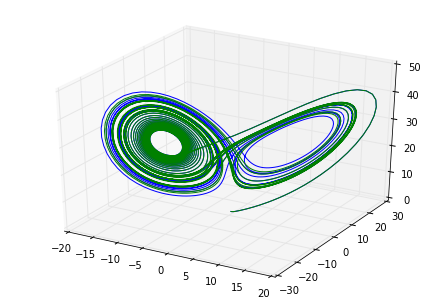

In [23]:
t = np.arange(0, 30, 0.01)
track1 = sint.odeint(lorenz, (0.0, 1.00, 0.0), t, args=(10.0, 28.0, 3.0))
track2 = sint.odeint(lorenz, (0.0, 1.01, 0.0), t, args=(10.0, 28.0, 3.0))
# 绘图
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
fig = plt.figure()
ax = Axes3D(fig)
ax.plot(track1[:,0], track1[:,1], track1[:,2])
ax.plot(track2[:,0], track2[:,1], track2[:,2])
plt.show()

#### 2.2 双摆系统

关于双摆系统更详细的介绍与复杂的数学推导一概略去，具体参考http://en.wikipedia.org/wiki/Double_pendulum。

In [24]:
import IPython.display
IPython.display.Image(url='http://upload.wikimedia.org/wikipedia/commons/6/65/Trajektorie_eines_Doppelpendels.gif')

直奔主题，由角速度和角动量组成的微分方程组如下：

$\begin{equation}
\left\{
\begin{aligned}
\dot{\theta_1} &= \frac{6}{ml^2}\frac{2p_{\theta_1}-3cos(\theta_1-\theta_2)p_{\theta_2}}{16-9cos^2(\theta_1-\theta_2)}\\
\dot{\theta_2} &= \frac{6}{ml^2}\frac{8p_{\theta_2}-3cos(\theta_1-\theta_2)p_{\theta_1}}{16-9cos^2(\theta_1-\theta_2)}\\
\dot{p}_{\theta_1} &= -\frac{1}{2}ml^2\left[\dot{\theta_1}\dot{\theta_2}sin(\theta_1-\theta_2)+3\frac{g}{l}sin\theta_1\right] \\
\dot{p}_{\theta_2} &= -\frac{1}{2}ml^2\left[-\dot{\theta_1}\dot{\theta_2}sin(\theta_1-\theta_2)+\frac{g}{l}sin\theta_2\right] \\
\end{aligned}
\right.
\end{equation}$

In [25]:
g = 9.8
L = 0.6
m = 0.1

def double_pendulum(x,t):
    t1,t2,p1,p2 = tuple(x)
    dt1 = 6.0/(m*L**2)*(2*p1-3*np.cos(t1-t2)*p2)/(16-9*np.cos(t1-t2)**2)
    dt2 = 6.0/(m*L**2)*(8*p2-3*np.cos(t1-t2)*p1)/(16-9*np.cos(t1-t2)**2)
    dp1 = -0.5*m*L**2*( dt1*dt2*np.sin(t1-t2)+3*(g/L)*np.sin(t1))
    dp2 = -0.5*m*L**2*(-dt1*dt2*np.sin(t1-t2)+(g/L)*np.sin(t2))
    return [dt1, dt2, dp1, dp2]

初值状态设置，时间栅格设置与常微分方程组定义：

In [26]:
x0 = [np.pi/2,np.pi/2,0.0,0.0]
t = np.linspace(0,500,5000)
dpsystem = sint.odeint(double_pendulum,x0,t)

绘制动态图形：注意这里要在终端/CMD下先输入bokeh-server回车，然后才能实现Ipython Notebook内的动画。

In [30]:
plot_config = dict(plot_width=600, plot_height=600, tools=TOOLS)
import time
import bokeh.models as bmo

bplt.output_server("animated")
p1 = bplt.figure(title='SciPy根据微分方程推演双摆系统轨迹',background_fill="#E8DDCB",x_range=[-1.3, 1.3],\
                 y_range=[-1.8, 0.8],**plot_config)

def update(n): 
    x1 = + L * np.sin(dpsystem[n, 0])
    y1 = - L * np.cos(dpsystem[n, 0])
    x2 = x1 + L * np.sin(dpsystem[n, 1])
    y2 = y1 - L * np.cos(dpsystem[n, 1])
    return (x1,x2,y1,y2)

x1,x2,y1,y2 = update(0)
p1.line([0, x1, x2], [0, y1 , y2], color='steelblue', line_width = 3 , name='line1', legend='看多了催眠')
bplt.show(p1)

renderer1 = p1.select(dict(name="line1"))
ds1 = renderer1[0].data_source


n = 0
while True:
    # Update y data of the source object
    x1,x2,y1,y2 = update(n%500)
    ds1.data["x"] = [0,x1,x2]
    ds1.data["y"] = [0,y1,y2]
    # store the updated source on the server
    bplt.cursession().store_objects(ds1)
    n+=1
    time.sleep(0.1)

Using saved session configuration for http://localhost:5006/
To override, pass 'load_from_config=False' to Session


/Users/wangweiyang/anaconda/anaconda/lib/python2.7/site-packages/bokeh/properties.py:166: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  return new == old


KeyboardInterrupt: 

# 3 SciPy插值算法 scipy.interpolate

使用scipy进行插值运算。

* 如果使用的是scipy.interpolate.interp1d,那么返回的相当于一个公式object，可以直接套在x上进行插值求值
* 如果使用的是scipy.interpolate.splrep样条表达，返回的对象需要再用样条求值函数splev来求值。

下图是几种插值函数的比较：

In [2]:
import scipy.interpolate as sinp
import numpy as np

n = np.arange(0,10)
x = np.linspace(0,9,100)

y_obs = np.sin(n) + 0.1 * np.random.randn(len(n))
y_real = np.sin(x)

inp1 = sinp.interp1d(n,y_obs)
y_inp1 = inp1(x)

inp2 = sinp.interp1d(n,y_obs,kind = 'cubic')
y_inp2 = inp2(x)

inp3 = sinp.splrep(n,y_obs)
y_inp3 = sinp.splev(x, inp3)


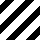
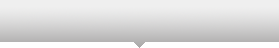
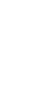
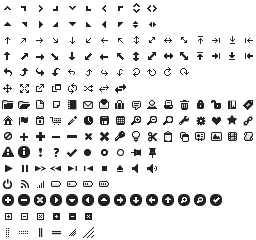
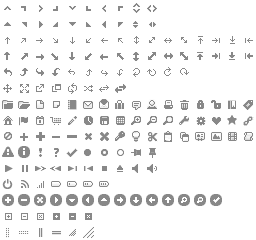
...
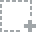
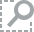
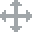
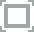
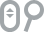

In [3]:
bplt.output_notebook()
plot_config = dict(plot_width=600, plot_height=360, tools=TOOLS)


p = bplt.figure(title="SciPy插值方法比较",
       background_fill="#E8DDCB",**plot_config)
p.scatter(n, y_obs, alpha=0.7, legend="观测值")
p.line(x, y_real, line_color='black', line_width=3, alpha=0.5, legend="函数曲线")
p.line(x, y_inp1, line_color='steelblue', line_width=2, alpha=0.5, legend="线性插值")
p.line(x, y_inp2, line_color='green', line_width=2, alpha=0.5, legend="三次样条")
p.line(x, y_inp3, line_color='magenta', line_width=2, alpha=0.5, legend="B样条")

bplt.show(p)

# 4 SciPy信号处理 scipy.signal与scipy.fftpack

### 4.1 使用scipy.fftpack做快速傅立叶变换

快速傅立叶变换（Fast Fourier Transforms）是常用的信号处理工具，能够快速的实现正向FFT（时域信号转频域）或者反向IFFT（频域信号转时域）。

SciPy提供Fortran版本的FFTPACK作为FFT计算的工具，效果拔群。

一句人话了解FFT:

### 将一个有限长离散信号序列按照信号波动的频率进行分解

频率分解是一种怎样的体验？

Nyquist定理又称香农采样定理告诉我们

### 为了恢复波形，采样频率至少为信号频率2倍

In [2]:
import scipy.fftpack as spfft
import numpy as np

t = np.linspace(0.0,np.pi*2.0,1024)
y1 = 5.0*np.sin(t*100.0+np.random.randn())
y2 = 3.0*np.sin(t*200.0+np.random.randn())
y3 = 2.0*np.sin(t*400.0+np.random.randn())
e0 = 1.0*np.random.randn(1024)


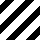
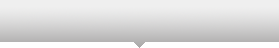
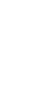
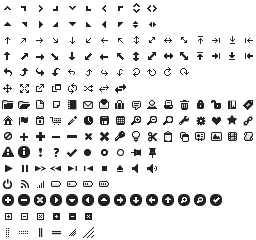
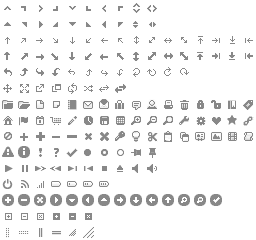
...
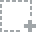
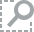
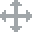
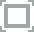
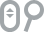

In [3]:
bplt.output_notebook()
p = bplt.figure(title="FFT频率分解",
       background_fill="#E8DDCB",**plot_config)
p.line(t/2/np.pi, [(i.real**2+i.imag**2)**0.5 for i in spfft.fft(y1+y2+y3+e0)], line_color='steelblue', \
        line_width=3, alpha=0.7, legend="FFT结果")
bplt.show(p)

不理解FFT的可以先看链接：
* http://en.wikipedia.org/wiki/Discrete_Fourier_transform
* http://en.wikipedia.org/wiki/Fast_Fourier_transform
* http://en.wikipedia.org/wiki/Cooley–Tukey_FFT_algorithm

用几行命令了解FFT
* http://rosettacode.org/wiki/Fast_Fourier_transform

In [4]:
#Recoded From http://rosettacode.org/wiki/Fast_Fourier_transform

def sup(x):
    return np.exp(-2j*np.pi*x)

supufunc = np.frompyfunc(sup,1,1)

def fft(x):
    N = len(x)
    if N <= 1: return x
    even = fft(x[0::2])
    odd =  fft(x[1::2])
    T = supufunc(np.arange(N/2.0)/float(N))*odd
    return np.concatenate((even+T,even-T))

a = np.array([1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0])
print ' '.join("%5.3f" % f for f in np.abs(fft(a)))
print ' '.join("%5.3f" % abs(f) for f in spfft.fft(a)) 

4.000 2.613 0.000 1.082 0.000 1.082 0.000 2.613
4.000 2.613 0.000 1.082 0.000 1.082 0.000 2.613


性能比较：

In [136]:
#timeit会缓存结果，使用time
import time
N = 18
x = np.random.rand(2**N)
t1 = time.clock()
res1 = fft(x)
t2 = time.clock()
res2 = spfft.fft(x)
t3 = time.clock()
print t2-t1,t3-t2

7.621353 0.011503


### 4.2 使用wave, pyAudio, scipy.signal做音频IIR滤波

很多音频信号处理的本质，都可以分为两类：

* 波形幅度调整（比如加个回声，波幅每反射一次就衰减，但频率不变）
* 波形频率调整（比如EQ，有Rock/Pop/Classical等音乐流派设置，就是不改变波幅而改变频率）

当我们关心频率调整时，EQ（均衡器）一般是由多个带通滤波器实现的，而带通滤波器在Python中可以由IIR来实现。

读入一个音频

In [5]:
import wave
f = wave.open('S1EP2_THU_slogan.wav','rb')

params = f.getparams()
nchannels, sampwidth, framerate, nframes = params[:4]

str_data = f.readframes(nframes)
f.close()

wave_data = np.fromstring(str_data, dtype=np.short)
wave_data.shape = -1,
wave_data = wave_data.T
time = np.arange(0, nframes) * (1.0 / framerate)

print nchannels, sampwidth, framerate, nframes, len(time),len(wave_data)

1 2 48000 450000 450000 450000


播放这段音频：

In [6]:
import pyaudio

chunk = 1024
wf = wave.open(r"S1EP2_THU_slogan.wav", 'rb')
p = pyaudio.PyAudio()

# 打开声音输出流
stream = p.open(format = p.get_format_from_width(wf.getsampwidth()),
                channels = wf.getnchannels(),
                rate = wf.getframerate(),
                output = True)

# 写声音输出流进行播放
while True:
    data = wf.readframes(chunk)
    if data == "": break
    stream.write(data)

stream.close()
p.terminate()

### 时域信号展现（音频幅值）


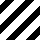
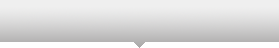
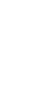
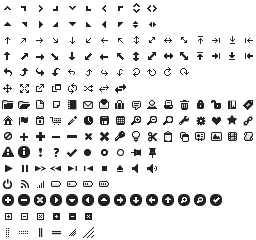
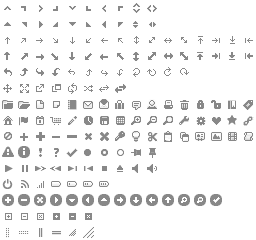
...
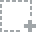
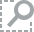
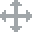
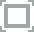
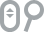

In [8]:
bplt.output_notebook()
p = bplt.figure(title="天行健",
       background_fill="#E8DDCB",**plot_config)
p.line([i*100/48000.0 for i in range(4500)],wave_data[::100], line_color='steelblue', \
        line_width=1, alpha=0.7, legend="君子以自强不息")
bplt.show(p)

### 信号频域特性（频率、相位等）

基频以上的频率段（人声泛音）被去除了。


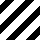
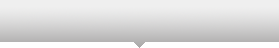
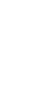
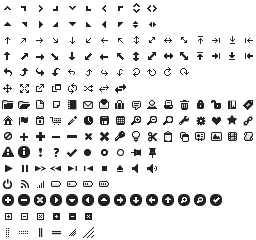
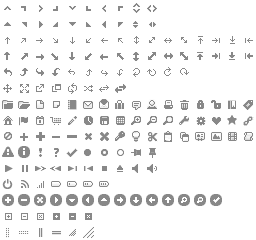
...
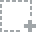
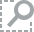
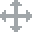
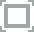
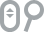

In [9]:
bplt.output_notebook()
p = bplt.figure(title="地势坤",
       background_fill="#E8DDCB",**plot_config)
p.line([i*10/450000.0*48000 for i in range(1500)],[(i.real**2+i.imag**2)**0.5 for i in spfft.fft(wave_data)][:15000:10], line_color='steelblue', \
        line_width=1, alpha=0.7, legend="君子以厚德载物")
bplt.show(p)

### IIR（无限脉冲响应）滤波器

IIR滤波器本质上也就是一个时间序列(Time Series)模型，它的目标是为了过滤掉数据序列中某些成分的。

这里我们用一个在音频上叠加滤波器的方式来对音频进行处理：

$ y(T) = \Sigma_{i=1}^N b_i x(T-i) - \Sigma_{i=1}^M a_i y(T-i)$

* $x$ : 输入序列
* $y$ : 输出序列
* $T$ : 采样点对应的时间点（所在序列的位置）
* $a_i$ : 相当于时间序列的MA项
* $b_i$ : 相当于时间序列的AR项

#### TIPS : 时间序列中的ARMA模型可以跟信号处理中的IIR做对比，时间序列中的AR模型可以跟信号处理中的FIR做对比。

试验一个音频信号中的"电话音效果器"，设计目标是48KHz采样音频，4.8KHz-14.4KHz至多衰减2db，2.4KHz以内,19.6K以上衰减40db。

In [110]:
import scipy.signal as ssig
bmed, amed = ssig.iirdesign([0.1, 0.3], [0.05, 0.4], 2, 40)

In [111]:
print bmed,amed

[ 0.01840726 -0.08087246  0.17330065 -0.25574044  0.28986708 -0.25574044
  0.17330065 -0.08087246  0.01840726] [  1.          -6.09236492  17.34620394 -30.01595443  34.46196173
 -26.85730117  13.88393608  -4.36308791   0.64231835]


In [60]:
ymed = ssig.lfilter(bmed, amed, wave_data)

In [68]:
print max(ymed),min(ymed)

1485.98218676 -1613.06029333


In [66]:
f = wave.open(r"S1EP2_THU_slogan_med.wav", "wb")

f.setnchannels(1)
f.setsampwidth(2)
f.setframerate(framerate)

f.writeframes(np.int16(ymed*4).tostring())
f.close()

In [67]:
wf = wave.open(r"S1EP2_THU_slogan_med.wav", 'rb')
p = pyaudio.PyAudio()

# 打开声音输出流
stream = p.open(format = p.get_format_from_width(wf.getsampwidth()),
                channels = wf.getnchannels(),
                rate = wf.getframerate(),
                output = True)

# 写声音输出流进行播放
while True:
    data = wf.readframes(chunk)
    if data == "": break
    stream.write(data)

stream.close()
p.terminate()

### 数字信号处理参考资料

* 滤波器：可以仅参考滤波器设计部分(Butterworth/Chebyshev/Elliptic) https://en.wikipedia.org/wiki/Electronic_filter

* Scipy Signal API：http://docs.scipy.org/doc/scipy/reference/signal.html#filtering